In [1]:
import numpy as np
import cv2
import os
import glob
from keras.models import model_from_json
from keras.preprocessing.image import load_img, img_to_array, array_to_img
import keras
import pickle
import matplotlib.pyplot as plt
from keras.applications.inception_v3 import InceptionV3, preprocess_input, decode_predictions
%matplotlib inline

Using TensorFlow backend.


In [2]:
img_width, img_height = 200, 200
train_data_dir = 'data/train'
validation_data_dir = 'data/validation'

In [3]:
category_names = [name for name in os.listdir(train_data_dir)]

In [4]:
model = model_from_json(open('inception_model.json').read())
model.load_weights('inception_model_weights.hdf5')

In [5]:
BOLD = '\033[1m'
ENDC = '\033[0m'
def predict_face(file):
    # 顔検出
    face_cascade = cv2.CascadeClassifier('./util/haarcascade_frontalface_alt.xml')
    _img = cv2.imread("./test/" + file) # ファイル名に全角はNG
    height, width, channels = _img.shape[:3]

    # 大きすぎる画像を一旦縮小
    if height > 400 or width > 400:
        _img = cv2.resize(_img, (400, int(height * 400 / width)))
        
    gray = cv2.cvtColor(_img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    for (x, y, w, h) in faces:
        print()
        print("-------------------------------------------------")
        print(os.path.basename(file))
        _img = _img[y:y+h,x:x+w] # トリミング

        _img = cv2.resize(_img, (img_height, img_width))    
        plt.imshow(cv2.cvtColor(_img, cv2.COLOR_BGR2RGB))
        plt.show()

        img_ary = np.array(img_to_array(_img))
        img_ary = img_ary / 255.0
        x = np.expand_dims(img_ary, axis=0)
        predicts = model.predict(x)
        p = np.argmax(predicts[0])
        for i, predict in enumerate(predicts[0]):
            if i == p:
                print(BOLD + "★" + category_names[i] + ": {:.4%}".format(predict) + ENDC)
            else:
                print("　" + category_names[i] + ": {:.4%}".format(predict))
        break
#    print(predicts)

In [6]:
files = glob.glob("./test/*")


-------------------------------------------------
IGotToMove_4.JPG


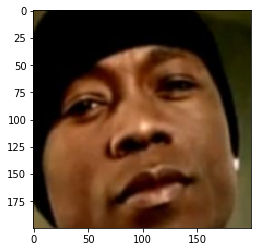

　disgust: 0.0009%
　happiness: 1.2064%
　sadness: 0.0002%
　surprised: 0.0000%
★neutral: 98.7864%
　angry: 0.0016%
　contempt: 0.0000%
　fear: 0.0044%

-------------------------------------------------
13.jpg


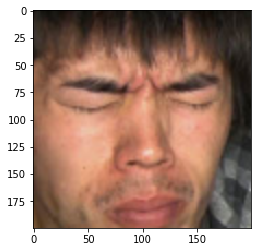

★disgust: 56.3460%
　happiness: 0.0008%
　sadness: 43.3584%
　surprised: 0.0000%
　neutral: 0.0124%
　angry: 0.2761%
　contempt: 0.0063%
　fear: 0.0000%

-------------------------------------------------
202593.jpg


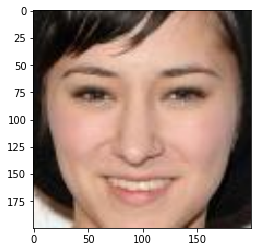

　disgust: 0.0057%
★happiness: 99.9608%
　sadness: 0.0012%
　surprised: 0.0000%
　neutral: 0.0267%
　angry: 0.0002%
　contempt: 0.0001%
　fear: 0.0052%

-------------------------------------------------
Cth5IDrUEAAxVPV.jpg


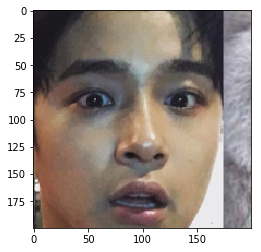

　disgust: 0.0323%
　happiness: 0.1740%
　sadness: 0.9029%
　surprised: 0.3418%
★neutral: 98.4354%
　angry: 0.0422%
　contempt: 0.0251%
　fear: 0.0463%

-------------------------------------------------
000154.jpg


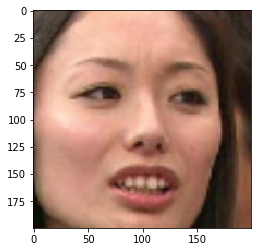

　disgust: 0.1589%
　happiness: 28.9617%
　sadness: 2.4045%
★surprised: 30.4126%
　neutral: 11.2863%
　angry: 5.7867%
　contempt: 0.0421%
　fear: 20.9473%

-------------------------------------------------
202592.jpg


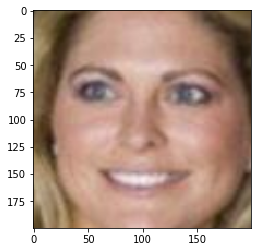

　disgust: 0.1233%
★happiness: 96.6853%
　sadness: 0.0000%
　surprised: 0.0002%
　neutral: 0.0266%
　angry: 0.0106%
　contempt: 0.0047%
　fear: 3.1493%

-------------------------------------------------
202566.jpg


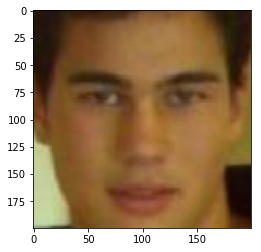

　disgust: 2.1893%
　happiness: 15.4705%
　sadness: 0.0071%
　surprised: 0.0998%
★neutral: 81.9598%
　angry: 0.0815%
　contempt: 0.1218%
　fear: 0.0702%

-------------------------------------------------
202578.jpg


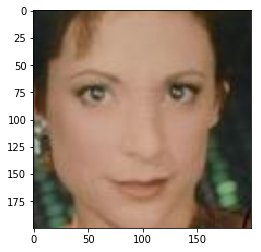

　disgust: 0.1357%
　happiness: 26.4497%
　sadness: 0.0086%
　surprised: 0.1545%
★neutral: 58.1138%
　angry: 1.1255%
　contempt: 0.3708%
　fear: 13.6413%

-------------------------------------------------
GettyImages-535314357-320x224.jpg


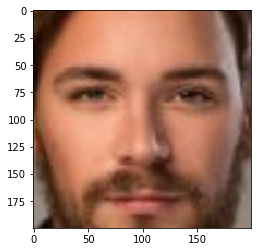

　disgust: 0.0982%
★happiness: 96.5718%
　sadness: 0.0017%
　surprised: 0.0007%
　neutral: 2.8615%
　angry: 0.0215%
　contempt: 0.0102%
　fear: 0.4343%

-------------------------------------------------
DI9iGPUVwAASr81.jpg


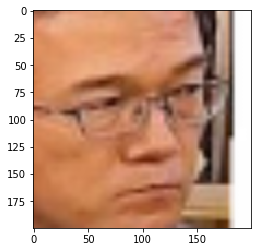

　disgust: 5.6550%
　happiness: 0.0036%
　sadness: 0.0006%
　surprised: 0.0002%
★neutral: 94.3348%
　angry: 0.0001%
　contempt: 0.0024%
　fear: 0.0032%

-------------------------------------------------
gf1770606489w.jpg


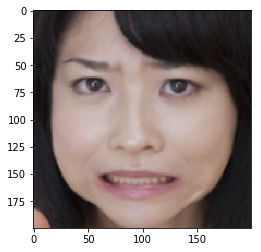

　disgust: 0.0000%
★happiness: 98.8247%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 1.1752%
　angry: 0.0001%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
3297.jpg


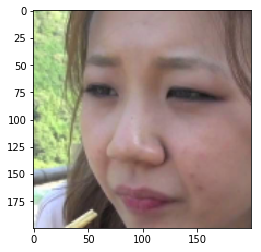

　disgust: 0.0160%
★happiness: 96.3851%
　sadness: 0.2208%
　surprised: 0.0007%
　neutral: 2.2084%
　angry: 1.0690%
　contempt: 0.0793%
　fear: 0.0206%

-------------------------------------------------
202567.jpg


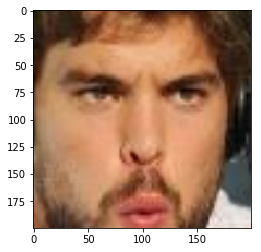

　disgust: 2.3847%
　happiness: 0.0063%
　sadness: 0.0480%
　surprised: 0.0270%
　neutral: 1.9668%
★angry: 58.5754%
　contempt: 0.0086%
　fear: 36.9832%

-------------------------------------------------
image.jpg


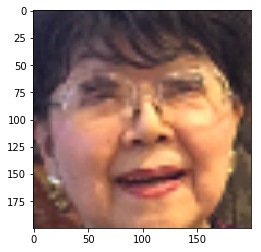

★disgust: 57.6432%
　happiness: 0.4357%
　sadness: 1.6999%
　surprised: 0.1127%
　neutral: 2.8410%
　angry: 35.2312%
　contempt: 0.0062%
　fear: 2.0300%

-------------------------------------------------
c6190a9f2c8e2270d550b2f2702eb95a_t.jpeg


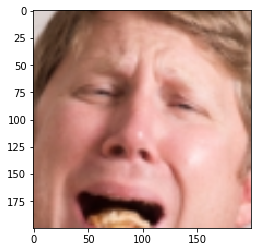

　disgust: 0.0116%
　happiness: 0.0078%
★sadness: 99.4448%
　surprised: 0.0129%
　neutral: 0.0219%
　angry: 0.0437%
　contempt: 0.0002%
　fear: 0.4571%

-------------------------------------------------
20130807000902.jpg


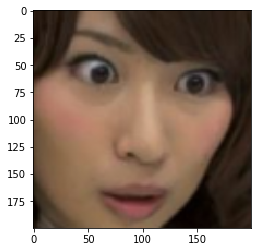

　disgust: 0.0000%
　happiness: 0.0008%
　sadness: 0.0000%
　surprised: 0.0000%
★neutral: 99.9992%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
34aabaabebf426e16bef657062ba901f_400.jpg


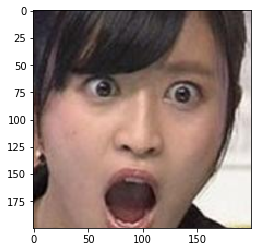

　disgust: 0.0000%
　happiness: 0.0001%
　sadness: 0.0000%
　surprised: 0.0011%
★neutral: 99.9987%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202261.jpg


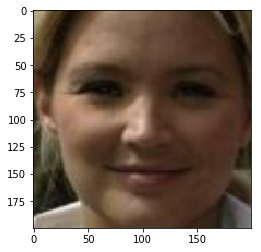

　disgust: 0.0007%
★happiness: 96.1458%
　sadness: 0.0007%
　surprised: 0.0703%
　neutral: 0.0105%
　angry: 1.1177%
　contempt: 0.0006%
　fear: 2.6536%

-------------------------------------------------
gd-jennie-kim-800x4011.jpg


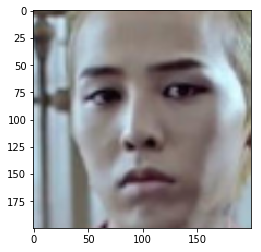

　disgust: 0.0785%
　happiness: 0.0542%
　sadness: 25.5273%
　surprised: 0.0010%
★neutral: 74.2993%
　angry: 0.0013%
　contempt: 0.0363%
　fear: 0.0022%

-------------------------------------------------
202562.jpg


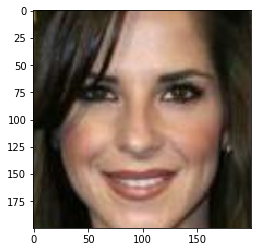

★disgust: 94.7309%
　happiness: 5.1254%
　sadness: 0.1331%
　surprised: 0.0000%
　neutral: 0.0010%
　angry: 0.0021%
　contempt: 0.0037%
　fear: 0.0039%

-------------------------------------------------
kounen34.jpg


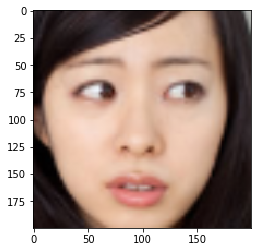

　disgust: 0.0001%
★happiness: 84.4769%
　sadness: 0.0001%
　surprised: 0.0005%
　neutral: 15.5222%
　angry: 0.0001%
　contempt: 0.0000%
　fear: 0.0001%

-------------------------------------------------
wysiwyg_gmd_823709b115af214f4f71.jpg


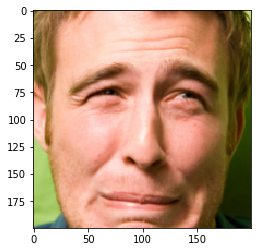

　disgust: 0.0549%
　happiness: 0.0150%
★sadness: 73.9448%
　surprised: 0.0201%
　neutral: 0.0223%
　angry: 0.0479%
　contempt: 24.9899%
　fear: 0.9051%

-------------------------------------------------
202564.jpg


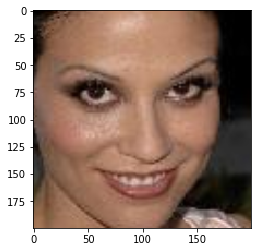

　disgust: 0.0121%
★happiness: 99.9726%
　sadness: 0.0001%
　surprised: 0.0000%
　neutral: 0.0047%
　angry: 0.0033%
　contempt: 0.0005%
　fear: 0.0067%

-------------------------------------------------
202595.jpg


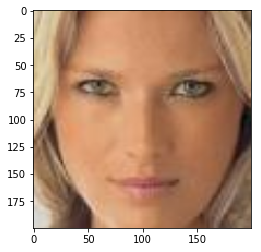

　disgust: 0.0188%
　happiness: 7.2372%
　sadness: 0.0452%
　surprised: 0.0231%
★neutral: 91.7894%
　angry: 0.1908%
　contempt: 0.3486%
　fear: 0.3469%

-------------------------------------------------
gackt-e1436171910609-696x392.jpg


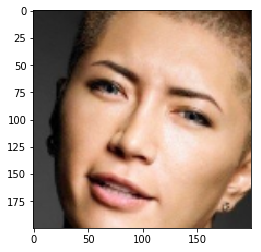

　disgust: 1.2187%
　happiness: 8.9115%
　sadness: 2.0409%
　surprised: 0.0672%
　neutral: 2.3147%
★angry: 84.9565%
　contempt: 0.3903%
　fear: 0.1001%

-------------------------------------------------
202581.jpg


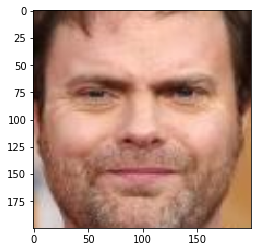

★disgust: 99.2197%
　happiness: 0.0334%
　sadness: 0.0014%
　surprised: 0.0006%
　neutral: 0.0034%
　angry: 0.6088%
　contempt: 0.0633%
　fear: 0.0694%

-------------------------------------------------
mig.jpg


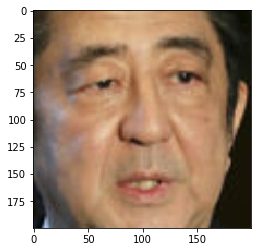

　disgust: 3.4092%
★happiness: 33.3885%
　sadness: 29.7835%
　surprised: 0.0224%
　neutral: 30.9872%
　angry: 0.7801%
　contempt: 0.0699%
　fear: 1.5593%

-------------------------------------------------
depositphotos_143799241-stock-photo-red-hair-woman-making-a.jpg


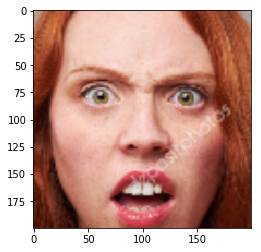

　disgust: 0.0000%
　happiness: 0.0000%
　sadness: 0.0000%
　surprised: 0.0024%
　neutral: 0.0000%
★angry: 99.7514%
　contempt: 0.0000%
　fear: 0.2462%

-------------------------------------------------
0911d256afebd04922d0b84057d63ae3_t.jpeg


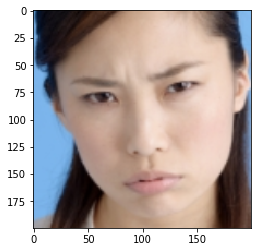

　disgust: 0.0009%
　happiness: 0.2062%
　sadness: 0.1598%
　surprised: 0.0008%
★neutral: 99.3765%
　angry: 0.0911%
　contempt: 0.1641%
　fear: 0.0006%

-------------------------------------------------
182191213.jpg


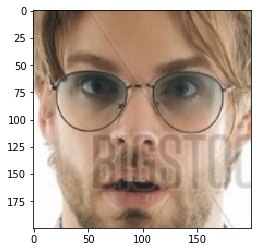

　disgust: 0.0001%
　happiness: 0.0210%
　sadness: 0.1947%
★surprised: 90.4205%
　neutral: 0.0014%
　angry: 5.4270%
　contempt: 0.0063%
　fear: 3.9291%

-------------------------------------------------
140807_h32.jpg


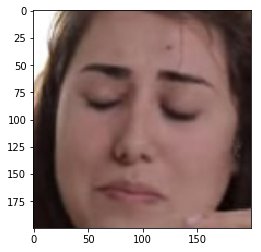

　disgust: 0.2358%
　happiness: 0.7816%
　sadness: 0.2471%
　surprised: 0.4114%
　neutral: 0.4768%
　angry: 33.6411%
★contempt: 62.7212%
　fear: 1.4850%

-------------------------------------------------
202580.jpg


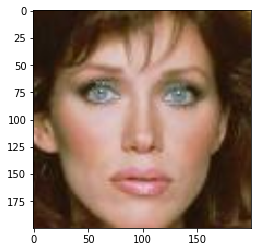

　disgust: 1.6673%
　happiness: 1.7168%
　sadness: 1.8292%
　surprised: 0.0186%
★neutral: 93.5625%
　angry: 0.4180%
　contempt: 0.1033%
　fear: 0.6843%

-------------------------------------------------
images (6).jpg


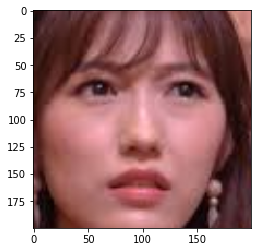

　disgust: 0.0367%
　happiness: 1.1605%
　sadness: 0.0153%
　surprised: 0.0728%
　neutral: 10.1732%
★angry: 87.2308%
　contempt: 0.0138%
　fear: 1.2969%

-------------------------------------------------
jTjEnnu.jpg


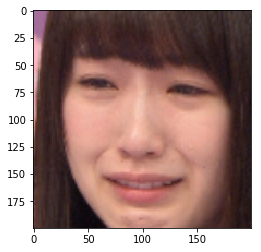

　disgust: 0.0295%
　happiness: 22.8464%
　sadness: 22.9382%
　surprised: 0.0002%
★neutral: 54.1822%
　angry: 0.0029%
　contempt: 0.0006%
　fear: 0.0000%

-------------------------------------------------
14918105-LL-imagenavi.jpg


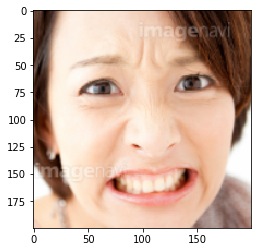

　disgust: 0.0292%
★happiness: 98.4542%
　sadness: 1.1010%
　surprised: 0.0066%
　neutral: 0.0007%
　angry: 0.2489%
　contempt: 0.0049%
　fear: 0.1544%

-------------------------------------------------
images (4).jpg


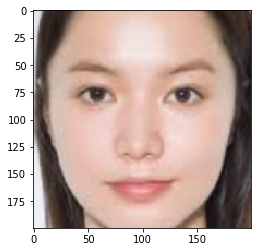

　disgust: 0.0532%
★happiness: 99.6548%
　sadness: 0.0003%
　surprised: 0.0001%
　neutral: 0.0844%
　angry: 0.0018%
　contempt: 0.0782%
　fear: 0.1271%

-------------------------------------------------
shutterstock_263610653.jpg


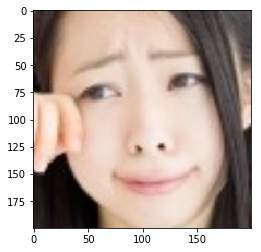

　disgust: 0.0523%
　happiness: 0.0494%
　sadness: 17.1991%
　surprised: 0.0471%
★neutral: 66.1731%
　angry: 0.0072%
　contempt: 0.0035%
　fear: 16.4683%

-------------------------------------------------
202266.jpg


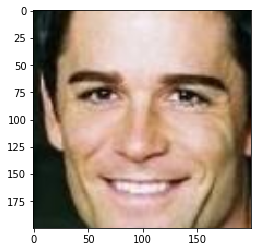

　disgust: 2.4899%
★happiness: 97.3843%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0034%
　angry: 0.0015%
　contempt: 0.1202%
　fear: 0.0004%

-------------------------------------------------
11530792_PW36.jpg


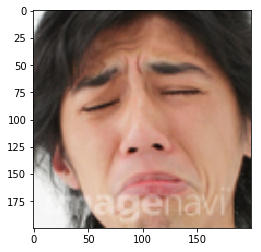

　disgust: 0.0075%
　happiness: 0.0016%
★sadness: 99.9455%
　surprised: 0.0012%
　neutral: 0.0265%
　angry: 0.0174%
　contempt: 0.0003%
　fear: 0.0001%

-------------------------------------------------
인현왕후의_남자_EP09_MASTER.m4v_163536.jpg


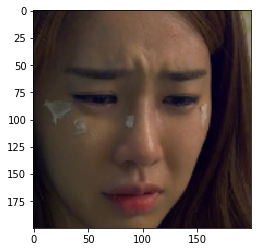

　disgust: 0.0009%
　happiness: 0.1067%
　sadness: 30.8638%
　surprised: 0.0148%
　neutral: 0.3388%
★angry: 68.6662%
　contempt: 0.0026%
　fear: 0.0062%

-------------------------------------------------
shutterstock_106472447.jpg


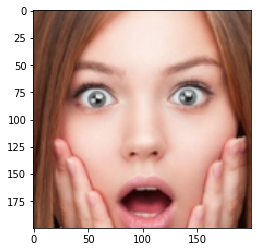

　disgust: 0.0002%
　happiness: 0.0051%
　sadness: 0.0009%
　surprised: 0.0417%
　neutral: 0.0457%
　angry: 4.0860%
　contempt: 0.0017%
★fear: 95.8188%

-------------------------------------------------
20150429170343177.jpg


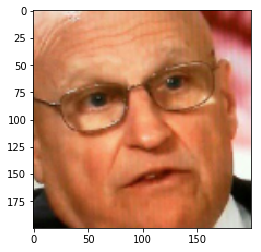

　disgust: 0.3675%
　happiness: 0.5125%
　sadness: 0.0011%
　surprised: 0.0159%
　neutral: 0.0259%
★angry: 97.9077%
　contempt: 0.3557%
　fear: 0.8139%

-------------------------------------------------
202270.jpg


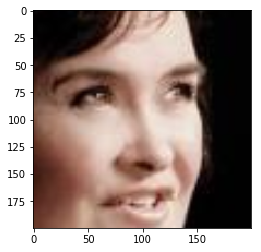

　disgust: 0.0475%
　happiness: 0.0019%
　sadness: 0.0019%
　surprised: 0.0001%
★neutral: 99.9486%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0001%

-------------------------------------------------
20170412-04490723.jpg


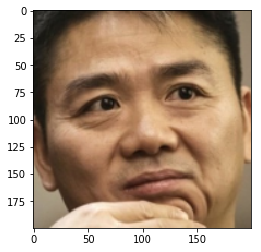

　disgust: 0.4601%
★happiness: 77.9450%
　sadness: 10.7912%
　surprised: 0.0082%
　neutral: 8.5417%
　angry: 0.0389%
　contempt: 0.2948%
　fear: 1.9201%

-------------------------------------------------
bsYUKA863_ok15185909.jpg


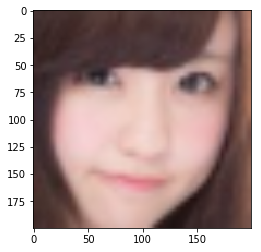

　disgust: 12.5205%
　happiness: 1.3594%
　sadness: 0.3557%
　surprised: 0.0663%
★neutral: 85.6240%
　angry: 0.0168%
　contempt: 0.0038%
　fear: 0.0535%

-------------------------------------------------
imgccd9868czik6zj.jpeg


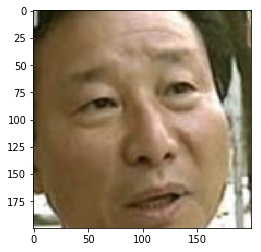

　disgust: 0.0063%
　happiness: 5.8362%
　sadness: 0.0401%
　surprised: 4.4143%
　neutral: 27.0769%
★angry: 59.3471%
　contempt: 0.7595%
　fear: 2.5195%

-------------------------------------------------
202269.jpg


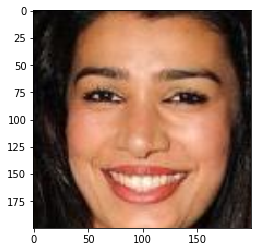

　disgust: 0.3508%
★happiness: 99.6205%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0141%
　angry: 0.0120%
　contempt: 0.0015%
　fear: 0.0009%

-------------------------------------------------
bc76dbdcf8084f07acd58f8b984cfbbe_t.jpeg


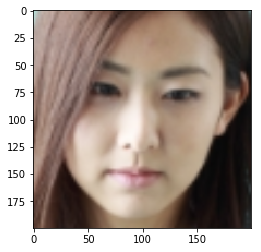

　disgust: 5.3744%
　happiness: 2.6939%
　sadness: 0.9137%
　surprised: 0.0033%
★neutral: 91.0094%
　angry: 0.0004%
　contempt: 0.0034%
　fear: 0.0015%

-------------------------------------------------
trump-reporter-disability-cnn.jpg


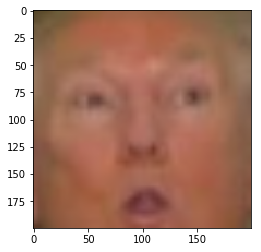

　disgust: 0.2372%
　happiness: 0.0145%
　sadness: 0.0007%
　surprised: 0.7634%
　neutral: 0.7709%
　angry: 0.1370%
　contempt: 0.1307%
★fear: 97.9455%

-------------------------------------------------
202572.jpg


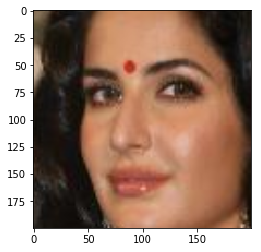

　disgust: 3.9069%
　happiness: 37.8046%
　sadness: 0.0013%
　surprised: 0.0134%
★neutral: 56.8400%
　angry: 0.1401%
　contempt: 0.3812%
　fear: 0.9125%

-------------------------------------------------
202586.jpg


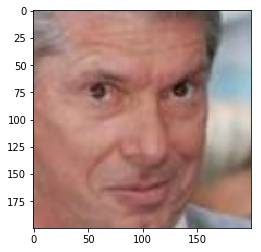

★disgust: 95.7205%
　happiness: 0.1474%
　sadness: 0.0020%
　surprised: 0.0028%
　neutral: 0.6009%
　angry: 3.4648%
　contempt: 0.0368%
　fear: 0.0248%

-------------------------------------------------
4a4e75160e6c5b367e764b080006f39a.jpg


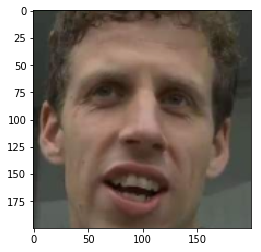

　disgust: 0.0404%
★happiness: 72.0375%
　sadness: 0.0651%
　surprised: 0.4091%
　neutral: 0.2820%
　angry: 24.8404%
　contempt: 1.3433%
　fear: 0.9822%

-------------------------------------------------
1_3.jpg


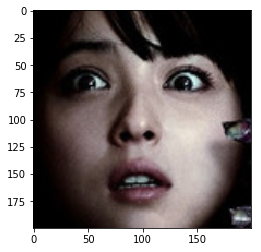

　disgust: 0.0000%
　happiness: 0.0041%
★sadness: 99.1882%
　surprised: 0.0129%
　neutral: 0.7913%
　angry: 0.0002%
　contempt: 0.0000%
　fear: 0.0034%

-------------------------------------------------
images (5).jpg


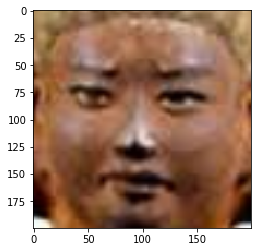

　disgust: 0.0591%
　happiness: 0.0094%
　sadness: 0.0017%
　surprised: 0.0021%
　neutral: 0.1411%
　angry: 8.5788%
　contempt: 0.0174%
★fear: 91.1904%

-------------------------------------------------
202275.jpg


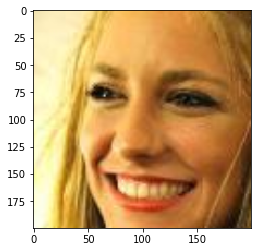

　disgust: 0.0055%
★happiness: 99.8480%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 0.0001%
　angry: 0.1445%
　contempt: 0.0007%
　fear: 0.0012%

-------------------------------------------------
Harbor_business_149165_1.png


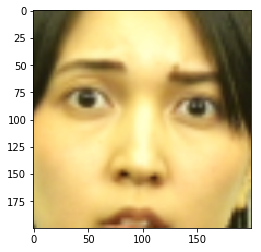

　disgust: 0.1019%
　happiness: 1.7151%
　sadness: 0.0125%
　surprised: 0.0521%
★neutral: 62.0313%
　angry: 0.0638%
　contempt: 0.0041%
　fear: 36.0192%

-------------------------------------------------
fy.jpg


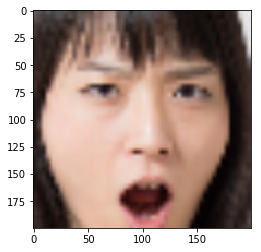

　disgust: 0.0008%
　happiness: 0.0002%
　sadness: 0.0251%
　surprised: 0.0008%
★neutral: 99.9717%
　angry: 0.0001%
　contempt: 0.0000%
　fear: 0.0013%

-------------------------------------------------
DHlGGqjUwAAQyES.jpg


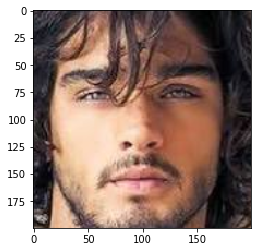

　disgust: 0.0001%
　happiness: 0.0000%
★sadness: 99.9978%
　surprised: 0.0000%
　neutral: 0.0018%
　angry: 0.0001%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202559.jpg


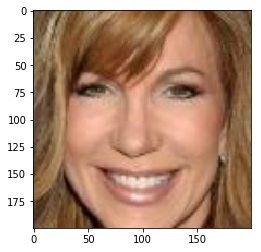

　disgust: 0.2689%
★happiness: 99.6823%
　sadness: 0.0001%
　surprised: 0.0000%
　neutral: 0.0004%
　angry: 0.0432%
　contempt: 0.0004%
　fear: 0.0048%

-------------------------------------------------
h_000026.jpg


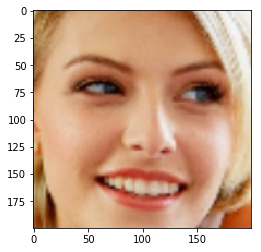

　disgust: 0.0000%
★happiness: 99.9894%
　sadness: 0.0005%
　surprised: 0.0020%
　neutral: 0.0001%
　angry: 0.0011%
　contempt: 0.0000%
　fear: 0.0069%

-------------------------------------------------
TSU89_kuchiwohenojinisuruwebd500.jpg


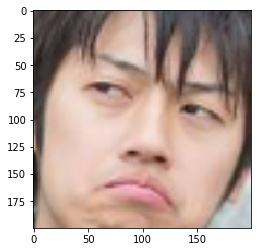

　disgust: 0.0000%
　happiness: 0.3774%
★sadness: 99.6211%
　surprised: 0.0002%
　neutral: 0.0007%
　angry: 0.0005%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202273.jpg


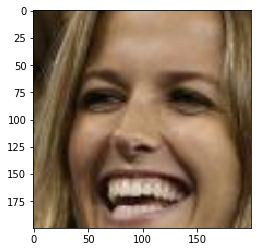

　disgust: 0.1352%
★happiness: 99.5827%
　sadness: 0.0030%
　surprised: 0.0000%
　neutral: 0.0061%
　angry: 0.0130%
　contempt: 0.0007%
　fear: 0.2592%

-------------------------------------------------
uchida.jpg


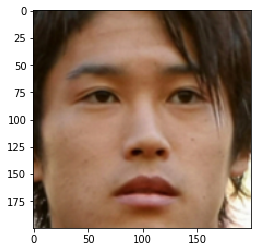

　disgust: 0.0077%
　happiness: 0.1495%
★sadness: 77.7138%
　surprised: 0.0764%
　neutral: 19.7328%
　angry: 2.2060%
　contempt: 0.0817%
　fear: 0.0321%

-------------------------------------------------
5eeceb8d9f3d5a19ca4065ac0715fd52-696x462.jpg


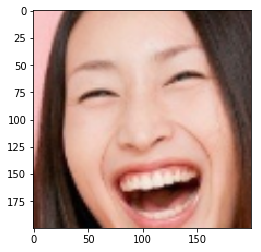

　disgust: 0.0236%
★happiness: 99.9288%
　sadness: 0.0192%
　surprised: 0.0001%
　neutral: 0.0005%
　angry: 0.0053%
　contempt: 0.0002%
　fear: 0.0223%

-------------------------------------------------
asaas.jpg


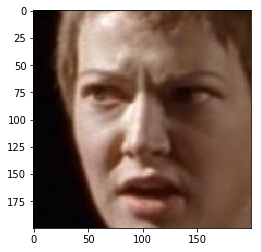

　disgust: 0.1023%
　happiness: 0.0069%
　sadness: 34.3964%
　surprised: 0.1173%
　neutral: 0.7935%
★angry: 64.3539%
　contempt: 0.0021%
　fear: 0.2278%

-------------------------------------------------
o0640048013713635609.jpg


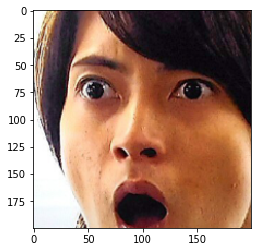

　disgust: 0.0000%
　happiness: 0.0000%
　sadness: 0.0495%
★surprised: 99.9504%
　neutral: 0.0001%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202588.jpg


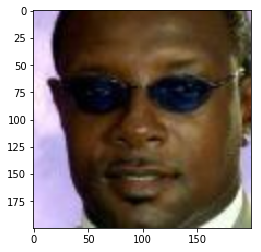

　disgust: 16.1215%
　happiness: 0.9223%
　sadness: 0.0016%
　surprised: 0.1030%
　neutral: 1.4203%
　angry: 2.5024%
★contempt: 75.0380%
　fear: 3.8909%

-------------------------------------------------
YOTA85_husaiyou215135819-thumb-1000xauto-14196.jpg


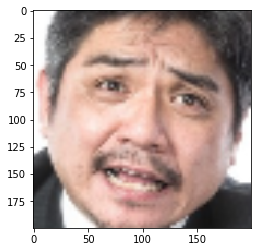

　disgust: 26.0854%
　happiness: 11.9728%
　sadness: 0.4229%
　surprised: 0.0331%
　neutral: 0.4888%
★angry: 35.0010%
　contempt: 1.0532%
　fear: 24.9427%

-------------------------------------------------
images (1).jpg


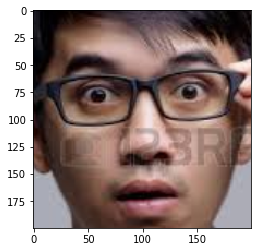

　disgust: 0.0018%
　happiness: 0.0529%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0017%
　angry: 0.0021%
　contempt: 0.0021%
★fear: 99.9391%

-------------------------------------------------
202262.jpg


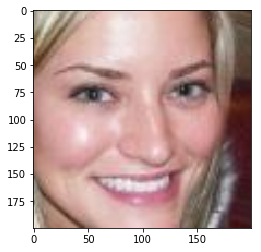

　disgust: 8.6023%
★happiness: 91.3295%
　sadness: 0.0008%
　surprised: 0.0000%
　neutral: 0.0015%
　angry: 0.0079%
　contempt: 0.0071%
　fear: 0.0509%

-------------------------------------------------
e59a725daa70a95128ef8b3f62fc6b56.jpg


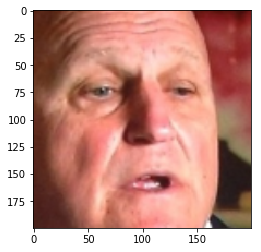

　disgust: 0.2006%
　happiness: 1.5912%
　sadness: 0.6654%
　surprised: 1.9716%
　neutral: 24.9380%
★angry: 68.3233%
　contempt: 0.2791%
　fear: 2.0309%

-------------------------------------------------
202576.jpg


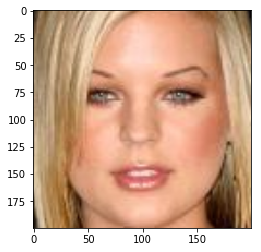

　disgust: 0.0041%
★happiness: 99.9281%
　sadness: 0.0005%
　surprised: 0.0005%
　neutral: 0.0061%
　angry: 0.0047%
　contempt: 0.0083%
　fear: 0.0476%

-------------------------------------------------
d0bbd991b13c1e4fc2fbc774283a53cf.jpg


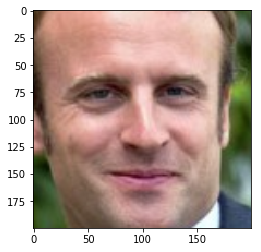

　disgust: 1.3225%
　happiness: 0.8576%
　sadness: 0.0031%
　surprised: 0.0170%
　neutral: 0.1370%
★angry: 96.7077%
　contempt: 0.9196%
　fear: 0.0354%

-------------------------------------------------
matome_20160421175030_571894561b732.png


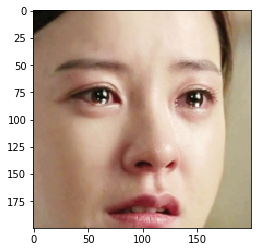

　disgust: 0.0000%
　happiness: 16.1337%
★sadness: 83.8655%
　surprised: 0.0003%
　neutral: 0.0000%
　angry: 0.0001%
　contempt: 0.0001%
　fear: 0.0003%

-------------------------------------------------
j6nQkZuyczc5OEg_26611.jpeg


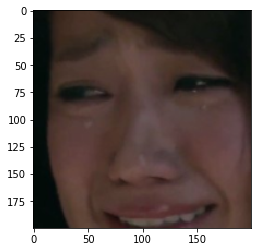

　disgust: 4.0315%
　happiness: 2.5202%
★sadness: 88.8257%
　surprised: 0.0252%
　neutral: 4.5377%
　angry: 0.0263%
　contempt: 0.0299%
　fear: 0.0035%

-------------------------------------------------
83-5.jpg


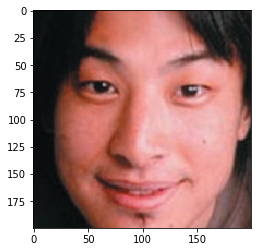

　disgust: 0.0018%
　happiness: 19.6576%
　sadness: 0.0002%
　surprised: 0.0021%
★neutral: 80.3262%
　angry: 0.0003%
　contempt: 0.0019%
　fear: 0.0099%

-------------------------------------------------
202579.jpg


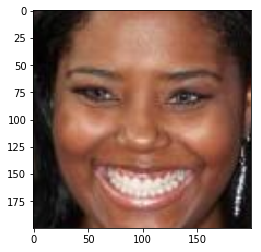

★disgust: 99.0581%
　happiness: 0.7587%
　sadness: 0.0005%
　surprised: 0.0002%
　neutral: 0.0079%
　angry: 0.1544%
　contempt: 0.0143%
　fear: 0.0060%

-------------------------------------------------
202590.jpg


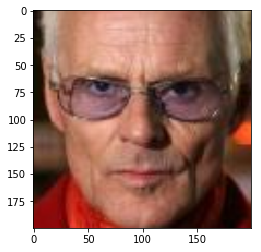

★disgust: 94.7752%
　happiness: 0.0009%
　sadness: 0.0018%
　surprised: 0.0000%
　neutral: 0.0008%
　angry: 0.0839%
　contempt: 4.8961%
　fear: 0.2412%

-------------------------------------------------
img_1c3701d541865224cf4e7aef754cff1716008.jpg


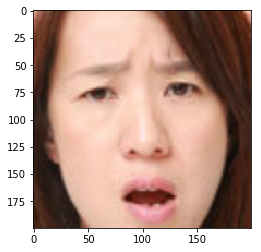

　disgust: 0.9448%
★happiness: 75.4258%
　sadness: 1.8399%
　surprised: 0.5685%
　neutral: 4.6385%
　angry: 1.2509%
　contempt: 0.0593%
　fear: 15.2722%

-------------------------------------------------
1303tokunaga.jpg


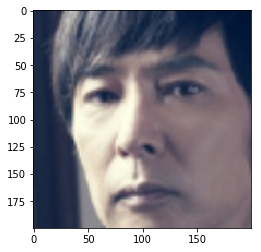

　disgust: 0.0000%
　happiness: 0.0014%
　sadness: 38.3666%
　surprised: 0.0000%
★neutral: 61.6318%
　angry: 0.0001%
　contempt: 0.0001%
　fear: 0.0000%

-------------------------------------------------
202558.jpg


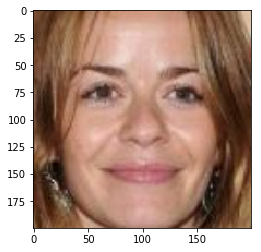

　disgust: 0.3421%
★happiness: 93.2763%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0040%
　angry: 0.0021%
　contempt: 0.0005%
　fear: 6.3748%

-------------------------------------------------
a0001159_parts_58f577399d8dd.jpg


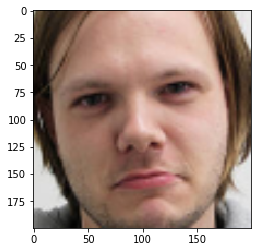

　disgust: 0.3675%
　happiness: 19.6430%
　sadness: 0.0447%
　surprised: 0.3233%
　neutral: 5.5117%
★angry: 73.2713%
　contempt: 0.2027%
　fear: 0.6358%

-------------------------------------------------
04.jpg


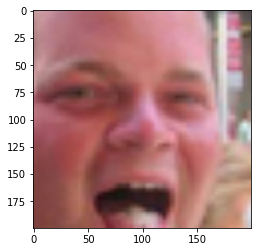

　disgust: 0.0548%
★happiness: 99.6999%
　sadness: 0.0001%
　surprised: 0.0009%
　neutral: 0.2011%
　angry: 0.0022%
　contempt: 0.0003%
　fear: 0.0407%

-------------------------------------------------
202575.jpg


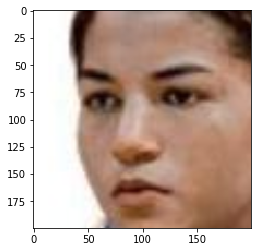

　disgust: 5.4790%
　happiness: 43.0979%
　sadness: 0.0874%
　surprised: 0.0081%
★neutral: 51.0946%
　angry: 0.0127%
　contempt: 0.0403%
　fear: 0.1801%

-------------------------------------------------
hakuhodo.jpg


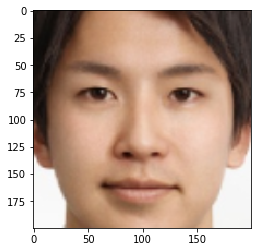

　disgust: 0.0001%
　happiness: 3.6501%
　sadness: 0.1810%
　surprised: 0.0091%
★neutral: 95.8757%
　angry: 0.1164%
　contempt: 0.0109%
　fear: 0.1566%

-------------------------------------------------
5ab6e0f0c59c45c3259e07d8842775e9_t.jpeg


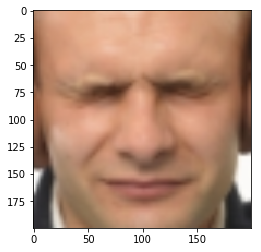

★disgust: 99.9994%
　happiness: 0.0000%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0006%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202568.jpg


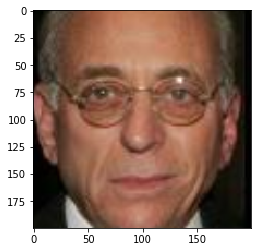

★disgust: 99.8526%
　happiness: 0.0009%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 0.0551%
　angry: 0.0008%
　contempt: 0.0001%
　fear: 0.0905%

-------------------------------------------------
202582.jpg


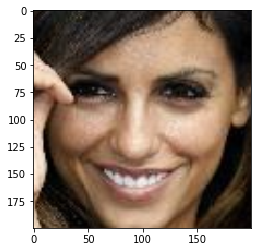

　disgust: 0.2927%
★happiness: 99.6979%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0003%
　contempt: 0.0001%
　fear: 0.0090%

-------------------------------------------------
202573.jpg


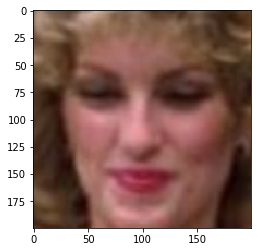

★disgust: 99.6342%
　happiness: 0.2926%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0670%
　angry: 0.0035%
　contempt: 0.0003%
　fear: 0.0021%

-------------------------------------------------
Patrick-Himes.jpg


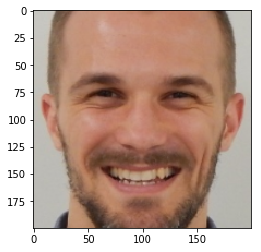

　disgust: 0.0000%
★happiness: 99.9994%
　sadness: 0.0002%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0004%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
o-99307084-570.jpg


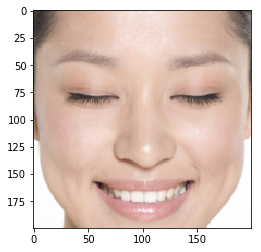

　disgust: 0.0000%
　happiness: 0.0058%
★sadness: 99.9939%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0004%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202274.jpg


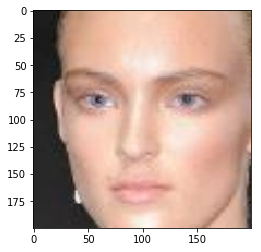

　disgust: 0.0301%
　happiness: 22.0012%
　sadness: 0.0000%
　surprised: 0.0002%
★neutral: 77.9398%
　angry: 0.0005%
　contempt: 0.0268%
　fear: 0.0014%

-------------------------------------------------
202563.jpg


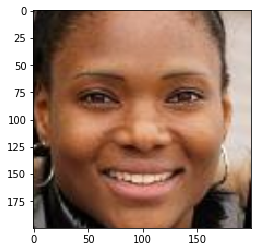

　disgust: 0.0001%
★happiness: 77.1336%
　sadness: 0.0001%
　surprised: 0.0034%
　neutral: 0.0001%
　angry: 16.4916%
　contempt: 0.0059%
　fear: 6.3653%

-------------------------------------------------
202561.jpg


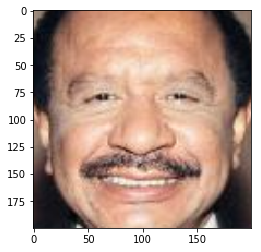

　disgust: 25.7033%
★happiness: 74.2158%
　sadness: 0.0160%
　surprised: 0.0000%
　neutral: 0.0013%
　angry: 0.0047%
　contempt: 0.0494%
　fear: 0.0095%

-------------------------------------------------
7fa00c_789d87b0ed8e41a2bb6cb2d4fa1185ac-mv2.png


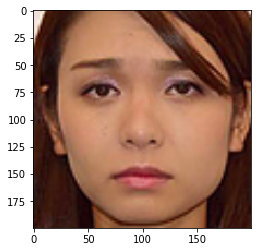

　disgust: 0.0082%
　happiness: 0.3546%
　sadness: 0.0283%
　surprised: 0.4248%
★neutral: 98.8341%
　angry: 0.2794%
　contempt: 0.0044%
　fear: 0.0660%

-------------------------------------------------
20170831-OYT8I50045-L.jpg


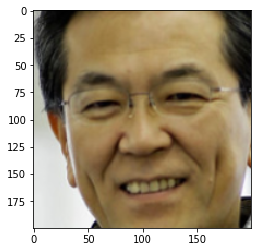

　disgust: 0.0015%
　happiness: 0.3797%
★sadness: 99.6121%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0004%
　contempt: 0.0062%
　fear: 0.0000%

-------------------------------------------------
202265.jpg


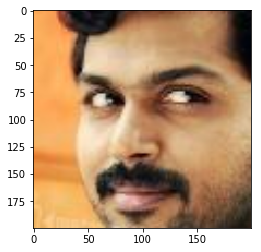

　disgust: 0.0001%
　happiness: 0.4351%
　sadness: 0.0016%
　surprised: 0.0016%
★neutral: 99.4928%
　angry: 0.0007%
　contempt: 0.0001%
　fear: 0.0679%

-------------------------------------------------
img_f73ee1c5dc451e514bdbc10fb6f4315291563.jpg


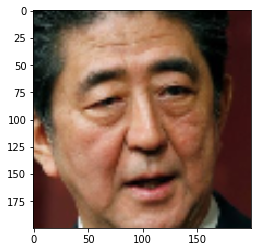

　disgust: 0.0297%
　happiness: 0.0003%
　sadness: 5.1255%
　surprised: 0.0000%
★neutral: 94.8445%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202569.jpg


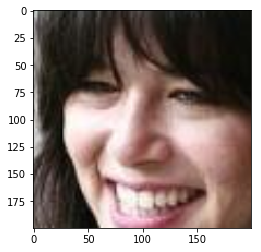

　disgust: 13.0298%
　happiness: 2.7460%
★sadness: 81.8011%
　surprised: 0.0064%
　neutral: 1.9169%
　angry: 0.4906%
　contempt: 0.0072%
　fear: 0.0020%

-------------------------------------------------
F201302071605461536522904.jpg


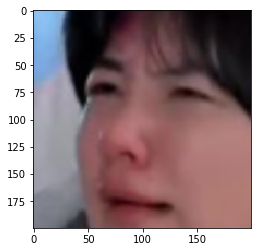

　disgust: 0.0794%
　happiness: 0.1030%
　sadness: 0.2090%
　surprised: 0.0003%
★neutral: 99.6033%
　angry: 0.0040%
　contempt: 0.0009%
　fear: 0.0000%

-------------------------------------------------
ojisan.jpg


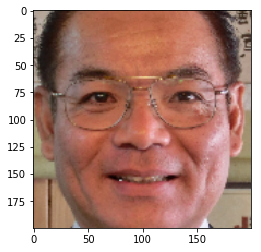

　disgust: 0.1832%
　happiness: 4.1041%
　sadness: 3.5273%
　surprised: 0.3338%
　neutral: 0.1602%
★angry: 49.7382%
　contempt: 36.2745%
　fear: 5.6787%

-------------------------------------------------
2c690166-6a4d-4e18-9f9b-ce755458c959.jpg


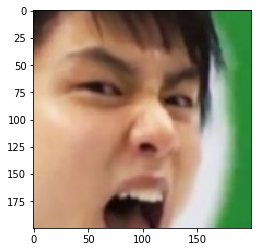

　disgust: 0.0001%
　happiness: 0.0007%
　sadness: 0.0017%
　surprised: 0.0005%
★neutral: 99.9970%
　angry: 0.0001%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
2017081700054_1.jpg


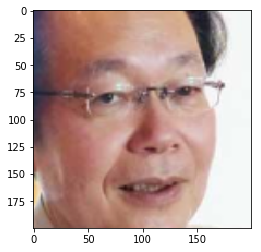

　disgust: 0.1220%
　happiness: 0.0001%
　sadness: 3.5161%
　surprised: 0.0374%
　neutral: 0.0883%
★angry: 96.1970%
　contempt: 0.0323%
　fear: 0.0068%

-------------------------------------------------
mukumi.png


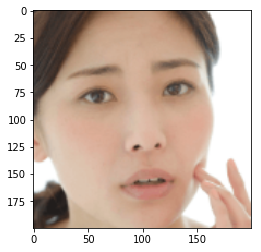

　disgust: 0.0000%
　happiness: 1.3359%
　sadness: 0.0003%
　surprised: 0.0042%
★neutral: 98.6591%
　angry: 0.0004%
　contempt: 0.0001%
　fear: 0.0000%

-------------------------------------------------
202267.jpg


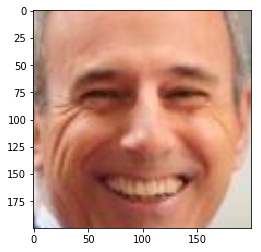

　disgust: 0.0635%
★happiness: 99.9297%
　sadness: 0.0004%
　surprised: 0.0000%
　neutral: 0.0008%
　angry: 0.0009%
　contempt: 0.0004%
　fear: 0.0042%

-------------------------------------------------
YoSushi2.jpg


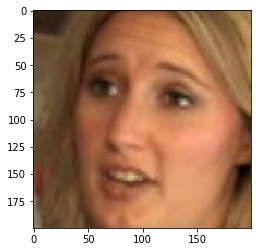

★disgust: 40.9305%
　happiness: 13.2354%
　sadness: 0.0011%
　surprised: 0.0766%
　neutral: 1.1549%
　angry: 40.3797%
　contempt: 0.1619%
　fear: 4.0599%

-------------------------------------------------
bcff632f.jpg


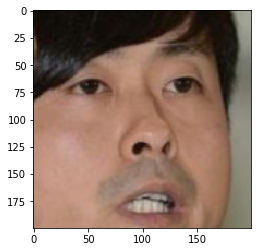

　disgust: 0.0100%
　happiness: 0.3795%
　sadness: 1.3180%
　surprised: 17.0886%
★neutral: 77.4832%
　angry: 2.2127%
　contempt: 0.2080%
　fear: 1.3000%

-------------------------------------------------
202268.jpg


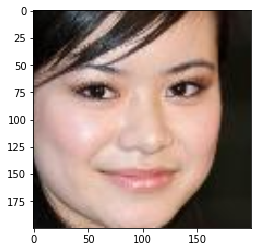

　disgust: 5.1666%
★happiness: 93.6894%
　sadness: 1.0864%
　surprised: 0.0006%
　neutral: 0.0048%
　angry: 0.0230%
　contempt: 0.0240%
　fear: 0.0053%

-------------------------------------------------
a52fa562559704ba0e4b5b5097a514b4_t.jpeg


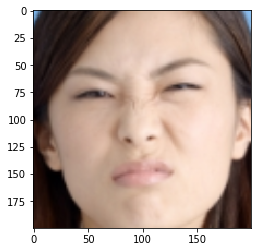

★disgust: 71.6297%
　happiness: 0.0831%
　sadness: 6.5318%
　surprised: 0.0159%
　neutral: 2.2134%
　angry: 19.1482%
　contempt: 0.1324%
　fear: 0.2456%

-------------------------------------------------
202589.jpg


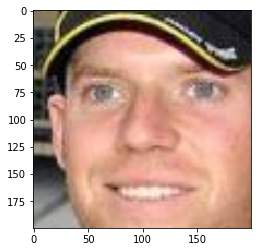

　disgust: 0.0882%
★happiness: 99.8866%
　sadness: 0.0000%
　surprised: 0.0006%
　neutral: 0.0036%
　angry: 0.0075%
　contempt: 0.0012%
　fear: 0.0121%

-------------------------------------------------
c1f7915e2fdea219a7b3b0d73317e183_t.jpeg


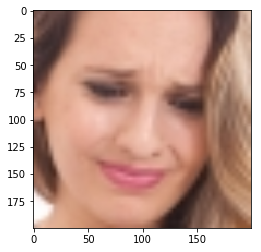

★disgust: 59.2132%
　happiness: 37.7538%
　sadness: 0.0260%
　surprised: 0.0001%
　neutral: 2.9917%
　angry: 0.0064%
　contempt: 0.0012%
　fear: 0.0075%

-------------------------------------------------
2016121415004103es.png


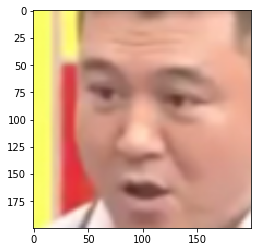

　disgust: 18.4903%
　happiness: 11.1218%
　sadness: 0.0069%
　surprised: 0.0002%
★neutral: 70.2909%
　angry: 0.0732%
　contempt: 0.0034%
　fear: 0.0134%

-------------------------------------------------
202594.jpg


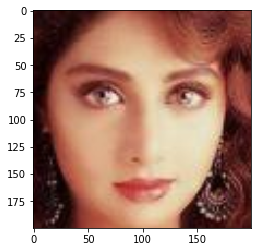

　disgust: 0.0000%
　happiness: 0.0064%
　sadness: 0.0001%
　surprised: 0.8095%
★neutral: 99.1832%
　angry: 0.0002%
　contempt: 0.0001%
　fear: 0.0005%

-------------------------------------------------
o0450034712592953972.jpg


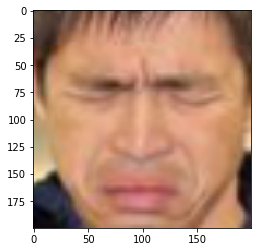

★disgust: 99.9953%
　happiness: 0.0001%
　sadness: 0.0013%
　surprised: 0.0000%
　neutral: 0.0017%
　angry: 0.0016%
　contempt: 0.0001%
　fear: 0.0000%

-------------------------------------------------
20161228-03571787.jpg


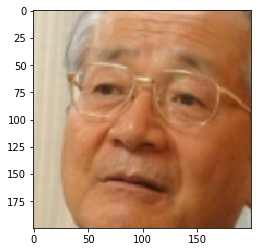

　disgust: 0.0380%
　happiness: 0.0295%
★sadness: 54.8406%
　surprised: 0.0306%
　neutral: 0.0040%
　angry: 0.0596%
　contempt: 41.8994%
　fear: 3.0982%

-------------------------------------------------
202583.jpg


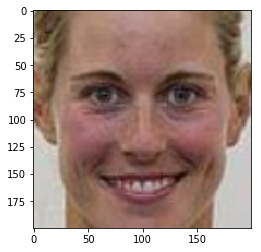

　disgust: 0.1146%
★happiness: 50.2712%
　sadness: 0.0010%
　surprised: 0.0040%
　neutral: 0.0038%
　angry: 8.4454%
　contempt: 0.0113%
　fear: 41.1486%

-------------------------------------------------
13156351-retrato-de-hombre-joven-sorprendi-contra-una-pared-del-grunge.jpg


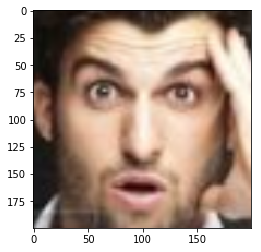

　disgust: 38.1686%
　happiness: 0.5826%
　sadness: 0.0013%
　surprised: 0.0118%
　neutral: 18.9513%
　angry: 2.5465%
　contempt: 0.1200%
★fear: 39.6179%

-------------------------------------------------
202587.jpg


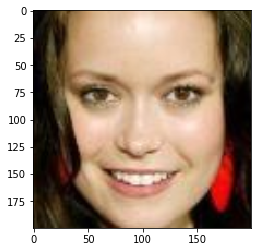

　disgust: 0.0036%
★happiness: 99.4705%
　sadness: 0.0006%
　surprised: 0.0026%
　neutral: 0.0009%
　angry: 0.3670%
　contempt: 0.0067%
　fear: 0.1482%

-------------------------------------------------
202263.jpg


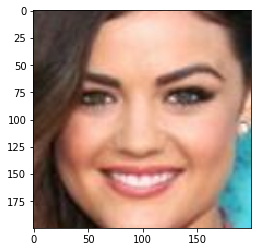

　disgust: 0.0099%
★happiness: 99.9887%
　sadness: 0.0000%
　surprised: 0.0000%
　neutral: 0.0013%
　angry: 0.0000%
　contempt: 0.0000%
　fear: 0.0001%

-------------------------------------------------
c21397d4e69b81a170490728c1404115_25922.jpeg


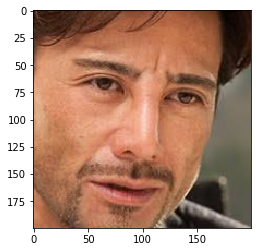

　disgust: 1.1519%
　happiness: 0.1886%
★sadness: 98.6135%
　surprised: 0.0018%
　neutral: 0.0001%
　angry: 0.0417%
　contempt: 0.0023%
　fear: 0.0001%

-------------------------------------------------
9.jpg


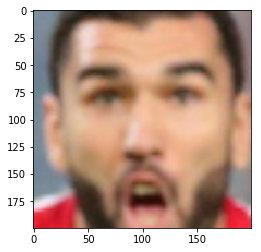

　disgust: 33.5590%
　happiness: 0.1330%
　sadness: 0.0032%
　surprised: 0.0419%
★neutral: 56.9780%
　angry: 1.8524%
　contempt: 0.0013%
　fear: 7.4310%

-------------------------------------------------
iphone_20111116232154.jpg


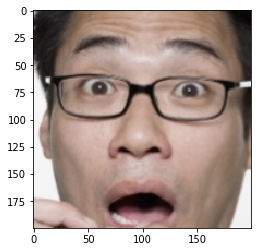

　disgust: 0.0029%
　happiness: 0.0477%
　sadness: 0.0032%
　surprised: 0.0010%
　neutral: 0.0019%
　angry: 0.0382%
　contempt: 0.0317%
★fear: 99.8735%

-------------------------------------------------
20150519030448.jpg


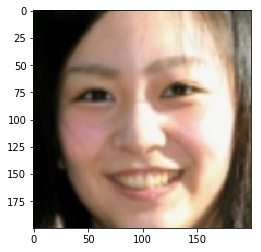

　disgust: 0.0009%
★happiness: 99.6808%
　sadness: 0.0001%
　surprised: 0.0000%
　neutral: 0.3099%
　angry: 0.0082%
　contempt: 0.0000%
　fear: 0.0000%

-------------------------------------------------
202571.jpg


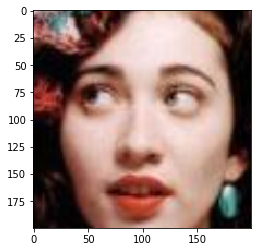

　disgust: 0.0029%
　happiness: 0.0188%
　sadness: 0.0000%
　surprised: 0.0740%
　neutral: 0.0005%
　angry: 0.3195%
　contempt: 0.0021%
★fear: 99.5823%

-------------------------------------------------
db1d9130cfdadea01dbed4968b58f8c1.jpg


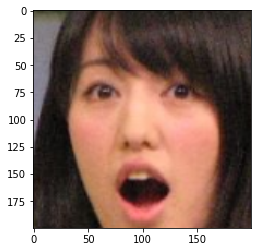

　disgust: 0.0010%
　happiness: 0.1779%
　sadness: 0.0041%
　surprised: 0.0414%
★neutral: 99.7743%
　angry: 0.0010%
　contempt: 0.0000%
　fear: 0.0002%

-------------------------------------------------
202596.jpg


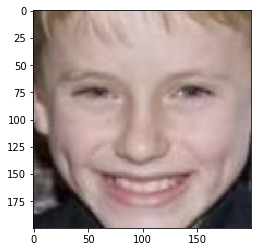

　disgust: 0.0003%
★happiness: 99.9994%
　sadness: 0.0001%
　surprised: 0.0000%
　neutral: 0.0000%
　angry: 0.0001%
　contempt: 0.0001%
　fear: 0.0001%

-------------------------------------------------
202577.jpg


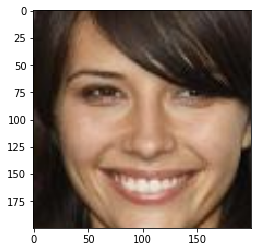

　disgust: 0.0165%
★happiness: 99.9668%
　sadness: 0.0016%
　surprised: 0.0000%
　neutral: 0.0144%
　angry: 0.0005%
　contempt: 0.0000%
　fear: 0.0002%

-------------------------------------------------
202271.jpg


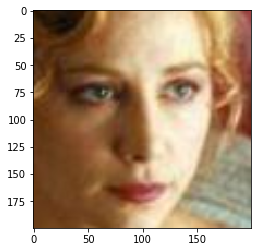

　disgust: 16.8197%
　happiness: 1.0133%
　sadness: 9.2744%
　surprised: 0.7580%
　neutral: 15.3709%
　angry: 4.3748%
　contempt: 0.1512%
★fear: 52.2377%

-------------------------------------------------
202264.jpg


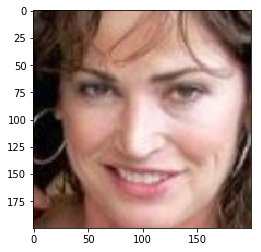

★disgust: 95.6094%
　happiness: 1.8259%
　sadness: 0.0312%
　surprised: 0.0003%
　neutral: 0.0749%
　angry: 2.4520%
　contempt: 0.0028%
　fear: 0.0036%

-------------------------------------------------
202591.jpg


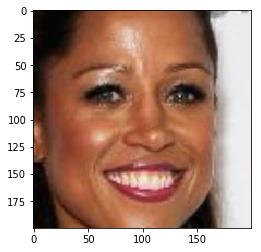

　disgust: 0.0022%
★happiness: 97.3696%
　sadness: 0.0014%
　surprised: 0.0002%
　neutral: 0.0001%
　angry: 0.0333%
　contempt: 0.0007%
　fear: 2.5924%

-------------------------------------------------
202560.jpg


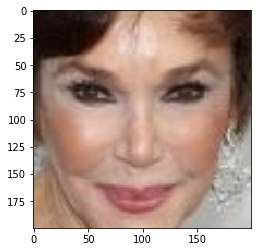

★disgust: 51.9758%
　happiness: 0.3415%
　sadness: 46.0855%
　surprised: 0.0001%
　neutral: 1.5356%
　angry: 0.0262%
　contempt: 0.0325%
　fear: 0.0029%

-------------------------------------------------
img_26bb04b8a7d6c4a6ebdaf5737b234f56148660.jpg


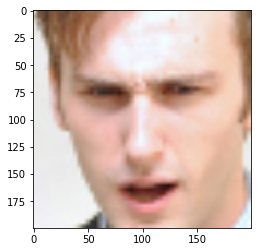

★disgust: 99.5203%
　happiness: 0.0001%
　sadness: 0.0019%
　surprised: 0.0001%
　neutral: 0.4540%
　angry: 0.0229%
　contempt: 0.0002%
　fear: 0.0005%

-------------------------------------------------
02306000023.jpg


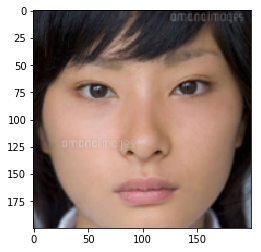

　disgust: 0.0006%
★happiness: 68.8728%
　sadness: 11.8290%
　surprised: 0.0740%
　neutral: 18.8432%
　angry: 0.3671%
　contempt: 0.0111%
　fear: 0.0022%

-------------------------------------------------
202574.jpg


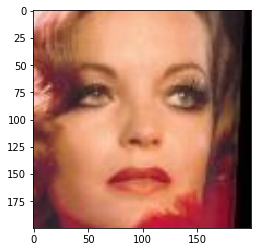

　disgust: 0.0531%
　happiness: 0.0012%
　sadness: 0.0006%
　surprised: 0.3262%
　neutral: 0.0374%
　angry: 0.0561%
　contempt: 0.0112%
★fear: 99.5141%


In [7]:
for file in files:
#    print(os.path.basename(file))
    predict_face(os.path.basename(file))